# 1. Load the dataset

## Read facebook_combined.txt and construct the undirected facebook network graph

In [7]:
import networkx as nx

def load_facebook_combined(file_path):
    G = nx.Graph()
    with open(file_path, 'r') as f:
        for line in f:
            node1, node2 = map(int, line.strip().split())
            G.add_edge(node1, node2)
    return G

facebook_graph = load_facebook_combined('facebook_combined.txt')
print(f"Number of nodes: {facebook_graph.number_of_nodes()}, Number of edges: {facebook_graph.number_of_edges()}")

Number of nodes: 4039, Number of edges: 88234


## Read all .edges files, combine them with facebook_graph and construct an array of ego_users

In [9]:
import os
import networkx as nx

def load_all_edges(folder_path, facebook_graph):
    ego_users = []
    for filename in os.listdir(folder_path):
        if filename.endswith(".edges"):
            ego_node = int(filename.split('.')[0])  ##extract the ego_user ID
            ego_users.append(ego_node)
            filepath = os.path.join(folder_path, filename)
            with open(filepath, 'r') as f:
                for line in f:             ##for every two nodes in every line, add one edge between them and add two between each of them with ego_user
                    node1, node2 = map(int, line.strip().split())
                    facebook_graph.add_edge(node1, node2)  
                    facebook_graph.add_edge(ego_node, node1)  
                    facebook_graph.add_edge(ego_node, node2)  
    return facebook_graph,ego_users

facebook_graph,ego_users = load_all_edges('E:/facebook', facebook_graph)
print(f"Number of nodes after combining: {facebook_graph.number_of_nodes()}, Number of edges after combining: {facebook_graph.number_of_edges()}")
print(ego_users)

number_of_friends= {}
for ego_user in ego_users:
    number_of_friends[ego_user]= len(set(facebook_graph.neighbors(ego_user)))

print(number_of_friends)

Number of nodes after combining: 4039, Number of edges after combining: 88234
[0, 107, 1684, 1912, 3437, 348, 3980, 414, 686, 698]
{0: 347, 107: 1045, 1684: 792, 1912: 755, 3437: 547, 348: 229, 3980: 59, 414: 159, 686: 170, 698: 68}


## Read all .circles files 

In [15]:
def load_all_circles(folder_path):
    all_circles = {}
    for filename in os.listdir(folder_path):
        if filename.endswith(".circles"):
            filepath = os.path.join(folder_path, filename)
            ego_user = int(filename.split('.')[0])  ##extract the ego_user ID
            with open(filepath, 'r') as f:
                circles = {}
                for line in f:
                    data = line.strip().split()               ##split every line
                    circle_name = data[0]                     ##first entry is the name of social circle
                    circle_members = list(map(int, data[1:]))     ##rest of the entires are other members in the social circle
                    circles[circle_name] = circle_members
                all_circles[ego_user] = circles
    return all_circles

all_circles = load_all_circles('E:/facebook')

## Print the information of social circles

In [17]:
def print_circle_info(circles_dict):
    for ego_user in ego_users:
        circles = circles_dict.get(ego_user, {})  
        unique_members = set()   
        print(f"{ego_user}'s social circle info：")
        for circle_name, members in circles.items():
            member_count = len(members)  
            unique_members.update(members)  
            print(f"  Social circle: {circle_name}")
            print(f"  Number of members: {member_count}")
            print(f"  List of members: {members}")
        
        total_unique_members_count = len(unique_members)
        print(f"  Total number of unique members in all social circles: {total_unique_members_count}")


print_circle_info(all_circles)

0's social circle info：
  Social circle: circle0
  Number of members: 20
  List of members: [71, 215, 54, 61, 298, 229, 81, 253, 193, 97, 264, 29, 132, 110, 163, 259, 183, 334, 245, 222]
  Social circle: circle1
  Number of members: 1
  List of members: [173]
  Social circle: circle2
  Number of members: 9
  List of members: [155, 99, 327, 140, 116, 147, 144, 150, 270]
  Social circle: circle3
  Number of members: 3
  List of members: [51, 83, 237]
  Social circle: circle4
  Number of members: 17
  List of members: [125, 344, 295, 257, 55, 122, 223, 59, 268, 280, 84, 156, 258, 236, 250, 239, 69]
  Social circle: circle5
  Number of members: 1
  List of members: [23]
  Social circle: circle6
  Number of members: 20
  List of members: [337, 289, 93, 17, 111, 52, 137, 343, 192, 35, 326, 310, 214, 32, 115, 321, 209, 312, 41, 20]
  Social circle: circle7
  Number of members: 2
  List of members: [225, 46]
  Social circle: circle8
  Number of members: 1
  List of members: [282]
  Social circ

## Read all .feat and .egofeat files

In [19]:
import pandas as pd
import os

def load_all_feats_and_ego_feats(folder_path):
    all_feats = {}
    ego_feats = {}
    for filename in os.listdir(folder_path):
        if filename.endswith(".feat"):
            ego_user = int(filename.split('.')[0])
            filepath = os.path.join(folder_path, filename)
            with open(filepath, 'r') as f:
                feats = {}
                for line in f:
                    data = list(map(int, line.strip().split()))  ##split every line 
                    user_id = data[0]           ##first entry is the user ID 
                    feats[user_id] = data[1:]   ##rest of the entries form a feature vector
                all_feats[ego_user] = feats
        elif filename.endswith(".egofeat"):
            user_id = int(filename.split('.')[0])  
            filepath = os.path.join(folder_path, filename)
            egofeat_data = pd.read_csv(filepath, sep=' ', header=None)
            ego_feats[user_id] = egofeat_data.values.flatten().tolist()
    return all_feats, ego_feats

all_feats, ego_feats = load_all_feats_and_ego_feats('E:/facebook')

## Print the information of feats 

In [21]:
number_of_users = {}
number_of_feats = {}
for ego_user in ego_users:
    number_of_users[ego_user]=len(all_feats[ego_user].keys())     ##number of users in ego_user.feat file
    base_dimension = None
    is_dimension_same = True
    for user_id, feat_vector in all_feats[ego_user].items():      ##dimension of feature vectors in ego_user.feat file  
        if base_dimension is None:
            base_dimension = len(feat_vector)
        elif len(feat_vector) != base_dimension:
            is_dimension_same = False                ##if the dimension of feature vectors in the same .feat file are not all same, return false
            break
    if is_dimension_same:
        number_of_feats[ego_user] = base_dimension

print(number_of_users)
print(number_of_feats)

{0: 347, 107: 1045, 1684: 792, 1912: 755, 3437: 547, 348: 227, 3980: 59, 414: 159, 686: 170, 698: 66}
{0: 224, 107: 576, 1684: 319, 1912: 480, 3437: 262, 348: 161, 3980: 42, 414: 105, 686: 63, 698: 48}


## Read all .featname files

In [23]:
def load_featnames(folder_path):
    all_featnames = {}
    for filename in os.listdir(folder_path):
        if filename.endswith(".featnames"):
            user_id = int(filename.split('.')[0])
            filepath = os.path.join(folder_path, filename)
            with open(filepath, 'r') as f:
                featnames = [line.strip() for line in f]
                all_featnames[user_id] = featnames
    return all_featnames

all_featnames = load_featnames('E:/facebook')

featnames_number = {}
for ego_user in ego_users:
    featnames_number[ego_user] = len(all_featnames[ego_user])
print(featnames_number)

{0: 224, 107: 576, 1684: 319, 1912: 480, 3437: 262, 348: 161, 3980: 42, 414: 105, 686: 63, 698: 48}


## Compute Pagerank Scores

In [25]:
pagerank = nx.pagerank(facebook_graph)

top_5_pagerank = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:5]
print("Top 5 Pagerank scores and corresponding nodes ：")
for node, score in top_5_pagerank:
    print(f"{node}: PageRank score = {score:.6f}")

Top 5 Pagerank scores and corresponding nodes ：
3437: PageRank score = 0.007615
107: PageRank score = 0.006936
1684: PageRank score = 0.006367
0: PageRank score = 0.006290
1912: PageRank score = 0.003877


## Visualizaiton

In [37]:
import matplotlib.pyplot as plt

def visualize_integrated_network(graph, circles_dict):
    plt.figure(figsize=(100, 100))
    
    pos = nx.spring_layout(graph,seed=12345)  ##generate spring layout
    nx.draw_networkx_edges(graph, pos, alpha=0.5, edge_color='grey')
    ##use 10 different colors to represent nodes in different social circles
    colors = [
        'red', 'green', 'blue', 'purple', 'orange',
        'yellow', 'cyan', 'magenta', 'lime', 'brown'
    ]
    
    handles = []
    labels = []
    
    for i, (user_id, circles) in enumerate(circles_dict.items()):
        for circle_name, members in circles.items():
            color = colors[i % len(colors)]  
            sizes = [graph.nodes[node].get('pagerank', 0.0001) * 20000 for node in members]  ##adjust the node sizes based on their PageRank scores
            nodes = nx.draw_networkx_nodes(graph, pos, nodelist=members, node_color=color, node_size=sizes, label=circle_name)
            if color not in labels:
                handles.append(nodes)
                labels.append(color)
    ##plot the nodes that are not in any social circles 
    other_nodes = set(graph.nodes()) - {node for circles in circles_dict.values() for circle in circles.values() for node in circle}
    other_sizes = [graph.nodes[node].get('pagerank', 0.0001) * 20000 for node in other_nodes]
    nx.draw_networkx_nodes(graph, pos, nodelist=list(other_nodes), node_color='black', node_size=other_sizes)
     
    plt.title("Facebook Graph", fontsize=100)
    plt.show()

nx.set_node_attributes(facebook_graph, name='pagerank', values=pagerank)
visualize_integrated_network(facebook_graph, all_circles)

# 2. Recommendation based on pagerank score, clustering index and mutual friends

## Define functions to calculate values of attributes

In [22]:
def get_pagerank_score1(candidate):
    pagerank_score=pagerank.get(candidate, 0)
    return pagerank_score
    
def calculate_clustering_index1(candidate):
    clustering_index= nx.clustering(facebook_graph, candidate)
    return clustering_index

def calculate_mutual_friends1(user, candidate):
    user_friends=set(facebook_graph.neighbors(user))
    candidate_friends=set(facebook_graph.neighbors(candidate))
    mutual_friends=len(user_friends & candidate_friends)/len(user_friends | candidate_friends)     ##use Jaccard similarity between friend sets
    if not user_friends or not candidate_friends:          ##neither user nor candidate has friends, return 0
        mutual_friends=0
    return mutual_friends

## Generate samples for training/testing and canditate samples for application

In [24]:
import random as rd
import numpy as np
from sklearn.model_selection import train_test_split

def generate_user_samples(user, test_ratio, sample_ratio):
    X = []  
    y = []  

    friends = set(facebook_graph.neighbors(user)) 
    sampled_friends= rd.sample(list(friends), int(len(friends) * sample_ratio))
    non_friends = set(facebook_graph.nodes()) - friends - {user}  
    sampled_non_friends = rd.sample(list(non_friends), int(len(friends) * sample_ratio)) 
      
    for friend in sampled_friends:                       ##generate postive samples
        pagerank_score = get_pagerank_score1(friend)
        mutual_friends = calculate_mutual_friends1(user, friend)
        clustering_index=calculate_clustering_index1(friend)
        X.append([pagerank_score, mutual_friends, clustering_index])
        y.append(1)                              ##for friends, set lable y=1

    for nf in sampled_non_friends:              ##generate negative samples
        pagerank_score = get_pagerank_score1(nf)
        mutual_friends = calculate_mutual_friends1(user, nf)
        clustering_index=calculate_clustering_index1(nf)
        X.append([pagerank_score, mutual_friends, clustering_index])
        y.append(0)                             ##for non_friends, set lable y=0
    return X,y
    
##generate data samples
def generate_user_samples_and_candidate_samples(user, test_ratio, sample_ratio):
    X = []  
    y = []  
    X_candidates = {}
    friends = set(facebook_graph.neighbors(user)) 
    sampled_friends= rd.sample(list(friends), int(len(friends) * sample_ratio))
    non_friends = set(facebook_graph.nodes()) - friends - {user}  
    sampled_non_friends = rd.sample(list(non_friends), int(len(friends) * sample_ratio))
    candidates= non_friends - set(sampled_non_friends)
      
    for friend in sampled_friends:                       ##generate postive samples
        pagerank_score = get_pagerank_score1(friend)
        mutual_friends = calculate_mutual_friends1(user, friend)
        clustering_index=calculate_clustering_index1(friend)
        X.append([pagerank_score, mutual_friends, clustering_index])
        y.append(1)                              

    for nf in sampled_non_friends:              ##generate negative samples
        pagerank_score = get_pagerank_score1(nf)
        mutual_friends = calculate_mutual_friends1(user, nf)
        clustering_index=calculate_clustering_index1(nf)
        X.append([pagerank_score, mutual_friends, clustering_index])
        y.append(0)                            
        
    for candidate in candidates:                 ##generate candidate samples
        pagerank_score = get_pagerank_score1(candidate)
        mutual_friends = calculate_mutual_friends1(user, candidate)
        clustering_index=calculate_clustering_index1(candidate)
        X_candidates[candidate]= [pagerank_score, mutual_friends, clustering_index]     
    return X, y, X_candidates

def generate_samples1(test_ratio, sample_ratio):
    X = []
    y = []  
    nodes = list(set(facebook_graph.nodes()) - {0})
    X0, y0, X_candidates1 = generate_user_samples_and_candidate_samples(0 , test_ratio, sample_ratio)
    X.extend(X0)
    y.extend(y0)
    for user in nodes:
        X0, y0 = generate_user_samples(user, test_ratio, sample_ratio)
        X.extend(X0)
        y.extend(y0)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_ratio, random_state=12345)
    return np.array(X_train), np.array(X_test), np.array(y_train), np.array(y_test), X_candidates1
    
X_train1, X_test1, y_train1, y_test1, X_candidates1 = generate_samples1(0.2, 0.5)

## Standardize the sample data

In [26]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train1 = scaler.fit_transform(X_train1)
X_test1 = scaler.transform(X_test1)

## Build a binary classification neural network model for friend recommendation

In [28]:
import numpy as np
from keras import models,layers, regularizers, optimizers

##build the model
model1 = models.Sequential()
model1.add(layers.Input(shape=(3,)))  
model1.add(layers.Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.1)))  ##use L2 regularizer with coeffiecient= 0.1
model1.add(layers.Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.1)))
model1.add(layers.Dense(1, activation='sigmoid'))  ##output layer, use sigmoid as activation function
model1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model1.summary()
## train the model
model1.fit(X_train1, y_train1, epochs=10, batch_size=32, validation_split=0.1)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32)             │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 673 (2.63 KB)

 Trainable params: 673 (2.63 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
3926/3926 ━━━━━━━━━━━━━━━━━━━━ 4s 671us/step - accuracy: 0.9139 - loss: 0.7547 - val_accuracy: 0.9322 - val_loss: 0.2916
Epoch 2/10
3926/3926 ━━━━━━━━━━━━━━━━━━━━ 2s 629us/step - accuracy: 0.9421 - loss: 0.2789 - val_accuracy: 0.9402 - val_loss: 0.2525
Epoch 3/10
3926/3926 ━━━━━━━━━━━━━━━━━━━━ 2s 630us/step - accuracy: 0.9453 - loss: 0.2492 - val_accuracy: 0.9496 - val_loss: 0.2320
Epoch 4/10
3926/3926 ━━━━━━━━━━━━━━━━━━━━ 2s 632us/step - accuracy: 0.9477 - loss: 0.2315 - val_accuracy: 0.9505 - val_loss: 0.2175
Epoch 5/10
3926/3926 ━━━━━━━━━━━━━━━━━━━━ 3s 646us/step - accuracy: 0.9500 - loss: 0.2183 - val_accuracy: 0.9524 - val_loss: 0.2066
Epoch 6/10
3926/3926 ━━━━━━━━━━━━━━━━━━━━ 2s 625us/step - accuracy: 0.9536 - loss: 0.2045 - val_accuracy: 0.9565 - val_loss: 0.1992
Epoch 7/10
3926/3926 ━━━━━━━━━━━━━━━━━━━━ 3s 639us/step - accuracy: 0.9546 - loss: 0.1968 - val_accuracy: 0.9574 - val_loss: 0.1930
Epoch 8/10
3926/3926 ━━━━━━━━━━━━━━━━━━━━ 3s 640us/step - accuracy: 0.9556 -

## Test the model

1091/1091 ━━━━━━━━━━━━━━━━━━━━ 1s 441us/step
Precision score: 0.98
Recall score: 0.94
F1 score: 0.96
Confusion Matrix:
[[17081   416]
 [ 1028 16365]]


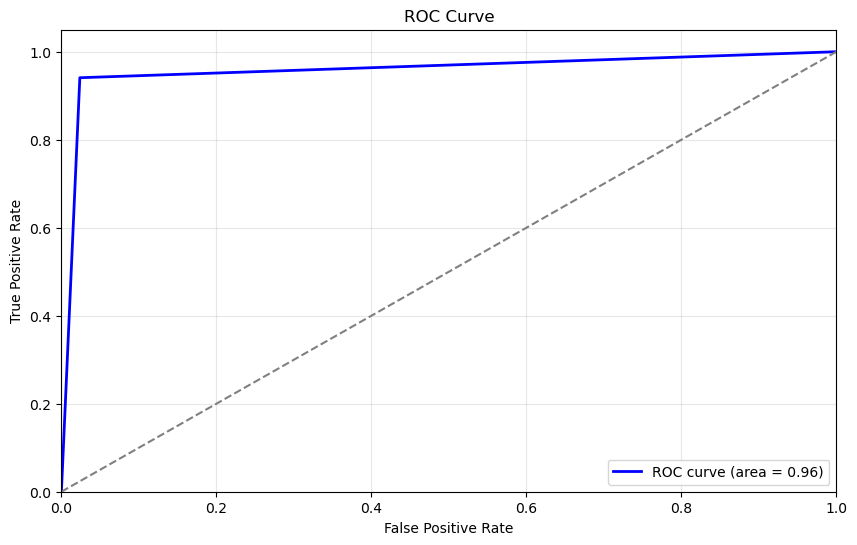

In [30]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_curve, auc
from sklearn.metrics import confusion_matrix

##use X_test1 to predict labels 
y_pred1 = (model1.predict(X_test1) > 0.5).astype("int32").flatten()

##calculate the precision score, recall score and F1 score of prediction
precision = precision_score(y_test1, y_pred1)
recall = recall_score(y_test1, y_pred1)
f1 = f1_score(y_test1, y_pred1)
print(f"Precision score: {precision:.2f}")
print(f"Recall score: {recall:.2f}")
print(f"F1 score: {f1:.2f}")

##calculate confusion matrix
conf_matrix = confusion_matrix(y_test1, y_pred1)
print("Confusion Matrix:")
print(conf_matrix)
##plot ROC Curve
fpr, tpr, thresholds = roc_curve(y_test1, y_pred1)  
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()

## Apply the recommendation model on user 0

In [32]:
candidate_ids = list(X_candidates1.keys())
candidate_attributes = list(X_candidates1.values())

X_candidates1_array = np.array(candidate_attributes)
X_candidates1_array = scaler.transform(X_candidates1_array)    ##standardization

##apply the model to candidate users, calculating the recommendation score of becoming a friend of user 0
y_candidate_scores1 = model1.predict(X_candidates1_array).flatten()  ##flatten the result into a one-dimensional array

##obtain top 5 candidates
top_5_indices = np.argsort(y_candidate_scores1)[::-1][:5] 
top_5_scores = y_candidate_scores1[top_5_indices]
top_5_users = [candidate_ids[i] for i in top_5_indices]

for i, user in enumerate(top_5_users):
    print(f"Candidate User {user} with score: {top_5_scores[i]:.2f}")

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 471us/step
Candidate User 3437 with score: 0.97
Candidate User 1684 with score: 0.96
Candidate User 1912 with score: 0.88
Candidate User 3980 with score: 0.56
Candidate User 686 with score: 0.56


## 2. Personal recommendation based on ego-specific pagerank score, clustering index, mutual friends and shared features 

## Check if for any ego_user, all the users in ego_user.feats are friends of ego_user

In [35]:
check={}
for ego_user in ego_users:
    does_user_belong=True
    for user in all_feats[ego_user].keys():
        if user not in set(facebook_graph.neighbors(ego_user)):
            does_user_belong=False
            break
    check[ego_user]=does_user_belong                 
 
print(check)

{0: True, 107: True, 1684: True, 1912: True, 3437: True, 348: True, 3980: True, 414: True, 686: True, 698: True}


## Find the users that are friends to more than one ego_user

In [37]:
set_of_intersections={}
number_of_intersections={}
for i, ego_user1 in enumerate(ego_users):
    set_of_intersections[ego_user1]=set()
    number_of_intersections[ego_user1]=0
    for ego_user2 in ego_users[i+1:]:
        intersection=set(facebook_graph.neighbors(ego_user1)) & set(facebook_graph.neighbors(ego_user2))
        set_of_intersections[ego_user1].update(intersection)
        number_of_intersections[ego_user1] += len(intersection)    
print(number_of_intersections)

{0: 14, 107: 55, 1684: 4, 1912: 4, 3437: 5, 348: 45, 3980: 1, 414: 0, 686: 27, 698: 0}


## Define a function that generates a ego_user's personal social network

In [39]:
def generate_ego_user_graph(ego_user):
    neighborhood=set(facebook_graph.neighbors(ego_user))-set_of_intersections[ego_user]
    feats_neighborhood= set(all_feats[ego_user].keys()) & neighborhood
    ego_user_graph = facebook_graph.subgraph(feats_neighborhood | {ego_user}).copy()
    return ego_user_graph

## Define functions to calculate values of attributes

In [41]:
def get_pagerank_score2(ego_user, candidate):
    ego_user_graph=generate_ego_user_graph(ego_user)
##define personalization which teleport set = {ego_user} and set taxation parameter = 0.8
    personalization= {node: 0 for node in ego_user_graph.nodes()}
    personalization[ego_user] = 1
    pagerank = nx.pagerank(ego_user_graph, 0.8, personalization) 
    return pagerank.get(candidate, 0)

def calculate_clustering_index2(ego_user, candidate):
    ego_user_graph= generate_ego_user_graph(ego_user)
    clustering_index = nx.clustering(ego_user_graph, candidate)
    return clustering_index
    
def calculate_mutual_friends2(ego_user, user, candidate):
    ego_user_graph = generate_ego_user_graph(ego_user)
    user_friends = set(ego_user_graph.neighbors(user))
    candidate_friends = set(ego_user_graph.neighbors(candidate))
    mutual_friends= len(user_friends & candidate_friends)/len(user_friends | candidate_friends)
    if not user_friends or not candidate_friends:
        mutual_friends=0
    return mutual_friends

def count_shared_features(ego_user, user, candidate):
    features1=all_feats[ego_user][user]
    features2=all_feats[ego_user][candidate]
    shared_features= sum(1 for f1, f2 in zip(features1, features2) if f1 == 1 and f2 == 1)
    return shared_features

## Pick ego_users for sample generation

In [43]:
ego_user_nodes = {}
for ego_user in ego_users:
    ego_user_nodes[ego_user]= generate_ego_user_graph(ego_user).number_of_nodes()

print(ego_user_nodes)
train_ego_users = [698, 686, 414, 348, 0]
print(train_ego_users)

{0: 341, 107: 1001, 1684: 790, 1912: 754, 3437: 544, 348: 184, 3980: 59, 414: 160, 686: 144, 698: 67}
[698, 686, 414, 348, 0]


## Generate samples for training/testing

In [45]:
from concurrent.futures import ThreadPoolExecutor, as_completed

def generate_ego_samples(ego_user, sample_ratio):
    X = []  
    y = []  
    ego_user_graph = generate_ego_user_graph(ego_user)
    nodes = list(ego_user_graph.nodes()-{ego_user})   ##exclude ego_user
    print(f"Processing ego_user: {ego_user}, node count: {len(nodes)}")
    for user in nodes:
        friends = set(ego_user_graph.neighbors(user)) - {ego_user}  
        sampled_friends= rd.sample(list(friends), int(len(friends) * sample_ratio))
        non_friends = set(ego_user_graph.nodes()) - friends - {user} - {ego_user} 
        sampled_non_friends = rd.sample(list(non_friends), int(len(friends) * sample_ratio))
        
        for friend in sampled_friends:              ##generate postive samples
            pagerank_score = get_pagerank_score2(ego_user, friend)
            clustering_index= calculate_clustering_index2(ego_user, friend)
            mutual_friends = calculate_mutual_friends2(ego_user, user, friend)
            shared_features = count_shared_features(ego_user, user, friend)
            X.append([pagerank_score, clustering_index, mutual_friends, shared_features])
            y.append(1)                    ##for friends, set lable y=1
        for nf in sampled_non_friends:           ##generate negative samples
            pagerank_score = get_pagerank_score2(ego_user, nf)
            clustering_index= calculate_clustering_index2(ego_user, nf)
            mutual_friends = calculate_mutual_friends2(ego_user, user, nf)
            shared_features = count_shared_features(ego_user, user, nf)
            X.append([pagerank_score, clustering_index, mutual_friends, shared_features])
            y.append(0)                    ##for non_friends, set lable y=0
    return X,y

def generate_samples2(test_ratio, sample_ratio):
    X = []
    y = []
    with ThreadPoolExecutor(max_workers=5) as executor:  ##create a thread pool with up to 5 worker threads 
        future_to_ego_user = {executor.submit(generate_ego_samples, ego_user, sample_ratio): ego_user for ego_user in train_ego_users}

        for future in as_completed(future_to_ego_user):
            ego_user = future_to_ego_user[future]
            try:
                X0, y0 = future.result()  ##fetch the results
                X.extend(X0)
                y.extend(y0)
            except Exception as exc:      ##if an exception occurs, print a message that includes the ego_user and the exception details.
                print(f'Ego user {ego_user} generated an exception: {exc}')

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_ratio, random_state=12345)
    return np.array(X_train), np.array(X_test), np.array(y_train), np.array(y_test)

X_train2, X_test2, y_train2, y_test2 = generate_samples2(0.2, 0.5)

Processing ego_user: 698, node count: 66
Processing ego_user: 686, node count: 143
Processing ego_user: 414, node count: 159
Processing ego_user: 348, node count: 183
Processing ego_user: 0, node count: 340


## Standardize the sample data

In [47]:
scaler = StandardScaler()
X_train2 = scaler.fit_transform(X_train2)
X_test2 = scaler.transform(X_test2)

## Build a binary classification neural network model for pesonalized friend recommendation

In [49]:
import numpy as np
from keras import models,layers, regularizers

##build the model
model2 = models.Sequential()
model2.add(layers.Input(shape=(4,)))  
model2.add(layers.Dense(16, activation='relu')) 
model2.add(layers.Dense(8, activation='relu'))
model2.add(layers.Dense(1, activation='sigmoid'))  ##output layer, use sigmoid as activation function
model2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model2.summary()
## train the model
model2.fit(X_train2, y_train2, epochs=10, batch_size=32, validation_split=0.1)
    

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 16)             │            80 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 225 (900.00 B)

 Trainable params: 225 (900.00 B)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
293/293 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6937 - loss: 0.5659 - val_accuracy: 0.8493 - val_loss: 0.3638
Epoch 2/10
293/293 ━━━━━━━━━━━━━━━━━━━━ 0s 681us/step - accuracy: 0.8618 - loss: 0.3372 - val_accuracy: 0.8570 - val_loss: 0.3284
Epoch 3/10
293/293 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step - accuracy: 0.8643 - loss: 0.3209 - val_accuracy: 0.8551 - val_loss: 0.3233
Epoch 4/10
293/293 ━━━━━━━━━━━━━━━━━━━━ 0s 707us/step - accuracy: 0.8728 - loss: 0.3084 - val_accuracy: 0.8560 - val_loss: 0.3250
Epoch 5/10
293/293 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step - accuracy: 0.8726 - loss: 0.2994 - val_accuracy: 0.8589 - val_loss: 0.3177
Epoch 6/10
293/293 ━━━━━━━━━━━━━━━━━━━━ 0s 678us/step - accuracy: 0.8687 - loss: 0.3067 - val_accuracy: 0.8570 - val_loss: 0.3204
Epoch 7/10
293/293 ━━━━━━━━━━━━━━━━━━━━ 0s 690us/step - accuracy: 0.8750 - loss: 0.2946 - val_accuracy: 0.8589 - val_loss: 0.3163
Epoch 8/10
293/293 ━━━━━━━━━━━━━━━━━━━━ 0s 679us/step - accuracy: 0.8687 - loss: 0.2980 - va

## Test the model

82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step
Precision score: 0.87
Recall score: 0.88
F1 score: 0.88
Confusion Matrix:
[[1171  161]
 [ 149 1122]]


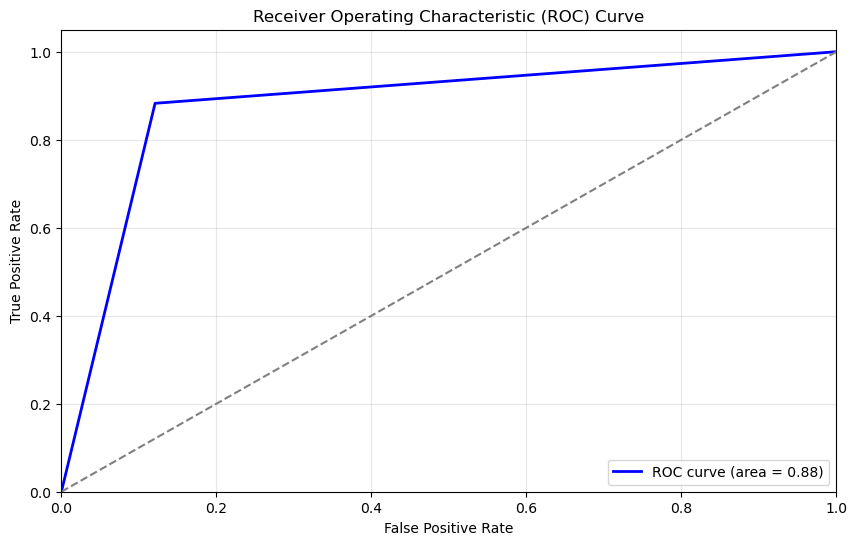

In [51]:
##use X_test2 to predict labels 
y_pred2 = (model2.predict(X_test2) > 0.5).astype("int32").flatten()

##calculate precision score and recall score of prediction
precision = precision_score(y_test2, y_pred2)
recall = recall_score(y_test2, y_pred2)
f1 = f1_score(y_test2, y_pred2)
print(f"Precision score: {precision:.2f}")
print(f"Recall score: {recall:.2f}")
print(f"F1 score: {f1:.2f}")

##calculate confusion matrix
conf_matrix = confusion_matrix(y_test2, y_pred2)
print("Confusion Matrix:")
print(conf_matrix)
##plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test2, y_pred2)  
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()

## Pick ego_user 3980 for application test

In [53]:
candidate_graph = generate_ego_user_graph(3980)
print(candidate_graph.nodes())

[3980, 3981, 3982, 3983, 3984, 3985, 3986, 3987, 3988, 3989, 3990, 3991, 3992, 3993, 3994, 3995, 3996, 3997, 3998, 3999, 4000, 4001, 4002, 4003, 4004, 4005, 4006, 4007, 4008, 4009, 4010, 4011, 4012, 4013, 4014, 4015, 4016, 4017, 4018, 4019, 4020, 4021, 4022, 4023, 4024, 4025, 4026, 4027, 4028, 4029, 4030, 4031, 4032, 4033, 4034, 4035, 4036, 4037, 4038]


## Apply the recommendation model on user 3981

In [55]:
##generate candidate samples for apllication
def generate_candidate_samples(ego_user, user):
    X_candidates= {} 
    ego_user_graph = generate_ego_user_graph(ego_user)
    friends = set(ego_user_graph.neighbors(user)) 
    non_friends = set(ego_user_graph.nodes()) - friends
    
    for candidate in  non_friends:   
        pagerank_score = get_pagerank_score2(ego_user, candidate)
        clustering_index= calculate_clustering_index2(ego_user, candidate)
        mutual_friends = calculate_mutual_friends2(ego_user, user, candidate)
        shared_features = count_shared_features(ego_user, user, candidate)
        X_candidates[candidate] = [pagerank_score, clustering_index, mutual_friends, shared_features]
    return X_candidates

X_candidates2= generate_candidate_samples(3980, 3981)

candidate_ids = list(X_candidates2.keys())
candidate_features = list(X_candidates2.values())

X_candidates2_array = np.array(candidate_features)
X_candidates2_array = scaler.transform(X_candidates2_array)

##apply the model to candidate users, calculating the recommendation score of becoming a friend of user 0
y_candidate_scores2 = model2.predict(X_candidates2_array).flatten()  ##flatten the result into a one-dimensional array

##obtain top 5 candidates
top_5_indices = np.argsort(y_candidate_scores2)[::-1][:5]  
top_5_scores = y_candidate_scores2[top_5_indices]
top_5_users = [candidate_ids[i] for i in top_5_indices]

for i, user in enumerate(top_5_users):
    print(f"Candidate User {user} with score: {top_5_scores[i]:.2f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Candidate User 3981 with score: 1.00
Candidate User 4030 with score: 0.98
Candidate User 3982 with score: 0.97
Candidate User 4002 with score: 0.92
Candidate User 4014 with score: 0.87
